In [1]:
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go

from io import StringIO
import json
import pandas as pd
import math
import numpy
import requests

import seaborn as sns
sns.set(style="ticks", color_codes=True)

init_notebook_mode()

# 2. Common Chart types

## Introduction
In this lesson we are going to be looking and som typical and less typical chart types, explain when the chart is appropriate and what type of data it best illustrates

## Basic Chart Types
- Scatter
- Bubble
- Line
- Filled Area
- Bar
- Pie
- Bullet Graph
- Sankey
- Gantt

### [Histogram](https://datavizcatalogue.com/methods/histogram.html)

- Distribution of data over continous interval
- Each Bar represents frequency
- Estimate to where values are concentrated
- Shows Gaps

#### Functions
- Comparison
- Data Over Time
- Distribution
- Patterns
- Range

#### Similar Graphs
- Bar chart
- Density Plot
- Population pyramid

In [2]:
chi_vals = numpy.random.chisquare(2, 10000)
gaussian_vals = numpy.random.normal(8, 1, 10000)
vals = numpy.append(chi_vals, gaussian_vals)

trace_chi = go.Histogram(
    x = chi_vals, 
    name = "Chi",
    opacity = 0.7,
    xbins = {
        'start' : 0,
        'end' : 18,
        'size' : 0.1
    }
)

trace_gaussian = go.Histogram(
    x = gaussian_vals, 
    name = "Gaussian",
    opacity = 0.7,
    xbins = {
        'start' : 0,
        'end' : 18,
        'size' : 0.1
    }
)

trace_all = go.Histogram(
    x = vals, 
    name = "All",
    xbins = {
        'start' : 0,
        'end' : 18,
        'size' : 0.1
    }
)

layout = {
    'barmode' : 'overlay'
}

fig = {
    'data' : [trace_all, trace_chi, trace_gaussian],
    'layout' : layout
}


iplot(fig)

### [Scatter](https://datavizcatalogue.com/methods/scatterplot.html)

- Plots 2 variables 1 against the other
- Shows correlation / Relationship

#### When to use 
Scatterplots are ideal when you have paired numerical data and you want to see if one variable impacts the other. However, do remember that correlation is not causation and another unnoticed variable may be influencing results.

#### Functions
- Patterns
- Relationships

In [3]:
iris = sns.load_dataset("iris")

In [4]:
traces = []
for species, dff in iris.groupby('species'):
    traces.append(
        go.Scatter(
            x = dff['sepal_length'],
            y = dff['sepal_width'],
            mode = 'markers',
            name = species,
        )
    )

iplot(traces)

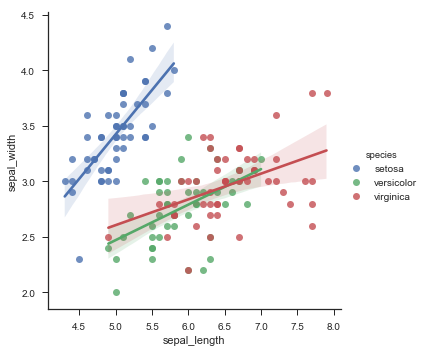

In [5]:
# Plot sepal with as a function of sepal_length across days
g = sns.lmplot(x="sepal_length", y="sepal_width", hue="species",
               truncate=True, data=iris)

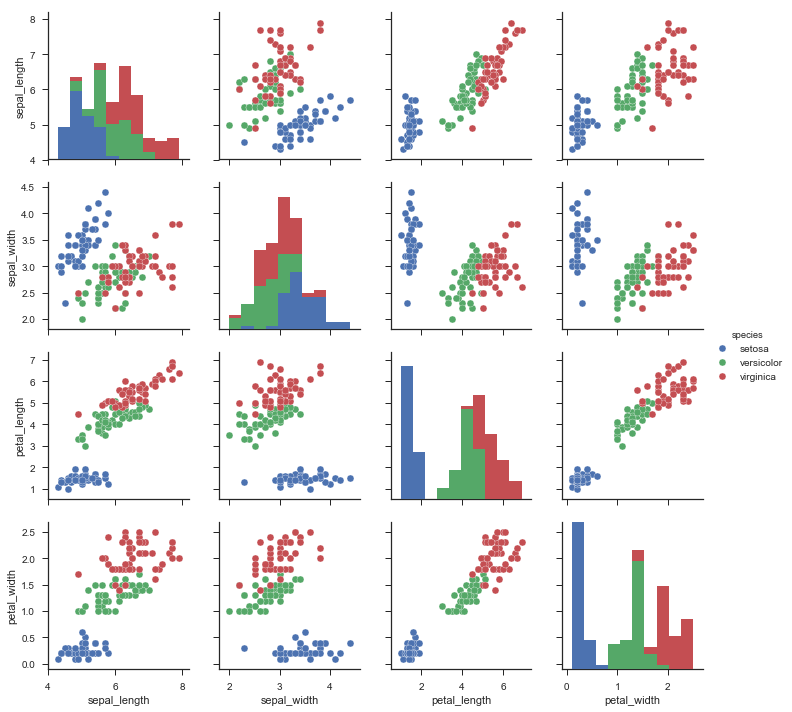

In [6]:
g = sns.pairplot(iris, hue="species")

### [Bubble](https://datavizcatalogue.com/methods/bubble_chart.html)

- Scatter plot with extra dimension(s) -> Size of Point, color of point

#### When To Use

Bubble Charts are typically used to compare and show the relationships between categorised circles, by the use of positioning and proportions. The overall picture of Bubble Charts can be use to analyse for patterns/correlations.

#### Dangers

- Lots of bubbles -> Hard to read
    - Can use interactivity to help
    
#### Functions

- Comparisons
- Data over Time
- Distributions
- Patterns
- Proportions
- Relationships

#### Similar Graphs
- Scatter
- Proportional Area

In [7]:
data = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv")
df_2007 = data[data['year']==2007]
df_2007 = df_2007.sort_values(['continent', 'country'])
slope = 2.666051223553066e-05
hover_text = []
bubble_size = []

for index, row in df_2007.iterrows():
    hover_text.append(('Country: {country}<br>'+
                      'Life Expectancy: {lifeExp}<br>'+
                      'GDP per capita: {gdp}<br>'+
                      'Population: {pop}<br>'+
                      'Year: {year}').format(country=row['country'],
                                            lifeExp=row['lifeExp'],
                                            gdp=row['gdpPercap'],
                                            pop=row['pop'],
                                            year=row['year']))
    bubble_size.append(math.sqrt(row['pop']*slope))

df_2007['text'] = hover_text
df_2007['size'] = bubble_size
sizeref = 2.*max(df_2007['size'])/(100**2)

trace0 = go.Scatter(
    x=df_2007['gdpPercap'][df_2007['continent'] == 'Africa'],
    y=df_2007['lifeExp'][df_2007['continent'] == 'Africa'],
    mode='markers',
    name='Africa',
    text=df_2007['text'][df_2007['continent'] == 'Africa'],
    marker=dict(
        symbol='circle',
        sizemode='area',
        sizeref=sizeref,
        size=df_2007['size'][df_2007['continent'] == 'Africa'],
        line=dict(
            width=2
        ),
    )
)
trace1 = go.Scatter(
    x=df_2007['gdpPercap'][df_2007['continent'] == 'Americas'],
    y=df_2007['lifeExp'][df_2007['continent'] == 'Americas'],
    mode='markers',
    name='Americas',
    text=df_2007['text'][df_2007['continent'] == 'Americas'],
    marker=dict(
        sizemode='area',
        sizeref=sizeref,
        size=df_2007['size'][df_2007['continent'] == 'Americas'],
        line=dict(
            width=2
        ),
    )
)
trace2 = go.Scatter(
    x=df_2007['gdpPercap'][df_2007['continent'] == 'Asia'],
    y=df_2007['lifeExp'][df_2007['continent'] == 'Asia'],
    mode='markers',
    name='Asia',
    text=df_2007['text'][df_2007['continent'] == 'Asia'],
    marker=dict(
        sizemode='area',
        sizeref=sizeref,
        size=df_2007['size'][df_2007['continent'] == 'Asia'],
        line=dict(
            width=2
        ),
    )
)
trace3 = go.Scatter(
    x=df_2007['gdpPercap'][df_2007['continent'] == 'Europe'],
    y=df_2007['lifeExp'][df_2007['continent'] == 'Europe'],
    mode='markers',
    name='Europe',
    text=df_2007['text'][df_2007['continent'] == 'Europe'],
    marker=dict(
        sizemode='area',
        sizeref=sizeref,
        size=df_2007['size'][df_2007['continent'] == 'Europe'],
        line=dict(
            width=2
        ),
    )
)
trace4 = go.Scatter(
    x=df_2007['gdpPercap'][df_2007['continent'] == 'Oceania'],
    y=df_2007['lifeExp'][df_2007['continent'] == 'Oceania'],
    mode='markers',
    name='Oceania',
    text=df_2007['text'][df_2007['continent'] == 'Oceania'],
    marker=dict(
        sizemode='area',
        sizeref=sizeref,
        size=df_2007['size'][df_2007['continent'] == 'Oceania'],
        line=dict(
            width=2
        ),
    )
)

data = [trace0, trace1, trace2, trace3, trace4]
layout = go.Layout(
    title='Life Expectancy v. Per Capita GDP, 2007',
    xaxis=dict(
        title='GDP per capita (2000 dollars)',
        gridcolor='rgb(255, 255, 255)',
        range=[2.003297660701705, 5.191505530708712],
        type='log',
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Life Expectancy (years)',
        gridcolor='rgb(255, 255, 255)',
        range=[36.12621671352166, 91.72921793264332],
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)

### [Line Graph](https://datavizcatalogue.com/methods/line_graph.html)

- quantitive information over continous variable -> Relationship

#### Dangers
- Avoid using too many lines

#### Functions
- Patterns
- Data over time
- Comparisons
- Error

#### Similar Graphs
- Area
- Stacked Area

In [8]:
# Add data
month = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
         'August', 'September', 'October', 'November', 'December']
high_2000 = [32.5, 37.6, 49.9, 53.0, 69.1, 75.4, 76.5, 76.6, 70.7, 60.6, 45.1, 29.3]
low_2000 = [13.8, 22.3, 32.5, 37.2, 49.9, 56.1, 57.7, 58.3, 51.2, 42.8, 31.6, 15.9]
high_2007 = [36.5, 26.6, 43.6, 52.3, 71.5, 81.4, 80.5, 82.2, 76.0, 67.3, 46.1, 35.0]
low_2007 = [23.6, 14.0, 27.0, 36.8, 47.6, 57.7, 58.9, 61.2, 53.3, 48.5, 31.0, 23.6]
high_2014 = [28.8, 28.5, 37.0, 56.8, 69.7, 79.7, 78.5, 77.8, 74.1, 62.6, 45.3, 39.9]
low_2014 = [12.7, 14.3, 18.6, 35.5, 49.9, 58.0, 60.0, 58.6, 51.7, 45.2, 32.2, 29.1]

# Create and style traces
trace0 = go.Scatter(
    x = month,
    y = high_2014,
    name = 'High 2014',
    legendgroup = "2014",
    line = dict(
        color = ('rgb(205, 12, 24)'),
        width = 4)
)
trace1 = go.Scatter(
    x = month,
    y = low_2014,
    name = 'Low 2014',
    legendgroup = "2014",
    line = dict(
        color = ('rgb(22, 96, 167)'),
        width = 4,)
)
trace2 = go.Scatter(
    x = month,
    y = high_2007,
    name = 'High 2007',
    legendgroup = "2007",
    opacity = 0.4,
    line = dict(
        color = ('rgb(205, 12, 24)'),
        width = 4,
        dash = 'dash') # dash options include 'dash', 'dot', and 'dashdot'
)
trace3 = go.Scatter(
    x = month,
    y = low_2007,
    name = 'Low 2007',
    legendgroup = "2007",
    opacity = 0.4,
    line = dict(
        color = ('rgb(22, 96, 167)'),
        width = 4,
        dash = 'dash')
)
trace4 = go.Scatter(
    x = month,
    y = high_2000,
    name = 'High 2000',
    legendgroup = "2000",
    opacity = 0.4,
    line = dict(
        color = ('rgb(205, 12, 24)'),
        width = 4,
        dash = 'dot')
)
trace5 = go.Scatter(
    x = month,
    y = low_2000,
    name = 'Low 2000',
    legendgroup = "2000",
    opacity = 0.4,
    line = dict(
        color = ('rgb(22, 96, 167)'),
        width = 4,
        dash = 'dot')
)
data = [trace0, trace1, trace2, trace3, trace4, trace5]

# Edit the layout
layout = dict(title = 'Average High and Low Temperatures in New York',
              xaxis = dict(title = 'Month'),
              yaxis = dict(title = 'Temperature (degrees F)'),
              )

fig = dict(data=data, layout=layout)
iplot(fig)

### [Filled Area](https://datavizcatalogue.com/methods/area_graph.html) / [Stacked Area](https://datavizcatalogue.com/methods/area_graph.html)

- Line Graph + area below filled
- Quantitive information of continous variables
- Idea that values have a base value (0)
- Often used to show trends rather than specific values
- Stacked allow comparison or parts to whole

#### Dangers
- Care must be taken when working with negative values

#### Functions
- Patterns
- Data over Time
- Comparison

#### Similar Graphs
- Line Graph

In [9]:
url = 'https://www.eia.gov/totalenergy/data/browser/csv.php?tbl=T01.02'
rep = requests.get(url)
energy_data = pd.read_csv(StringIO(rep.content.decode('utf-8')))

In [10]:
energy_data['Year'] = energy_data['YYYYMM'].apply(lambda val: val//100)
energy_data['Month'] = energy_data['YYYYMM'].apply(lambda val: val%100)
# If month = 13 -> whole year
energy_data = energy_data.replace('Not Available', numpy.NaN)
energy_data = energy_data.dropna()

In [11]:
sampled_df = energy_data[(energy_data['Year'] > 1990) & (energy_data['Month'] < 13)]
sampled_df.loc[:, 'Value'] = sampled_df.loc[:, 'Value'].apply(lambda x: float(x))
sorted_indexs = sampled_df.groupby('Description')['Value'].max().sort_values().index

traces = []
vals = numpy.repeat(0, 327).astype(float)
for source in sorted_indexs:
    dff = sampled_df[sampled_df['Description'] == source]
    vals += dff['Value'].apply(lambda x: float(x)).values
    traces.append(
        go.Scatter(
            x = dff['Year'] + dff['Month'] / 12,
            y = vals,
            name = source,
            fill = 'tonexty'
        )
    )
    
iplot(traces)

C:\Users\wesley.banfield\AppData\Local\conda\conda\envs\python3\lib\site-packages\pandas\core\indexing.py:537: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



### [Bar](https://datavizcatalogue.com/methods/bar_chart.html) / [Stacked Bar](https://datavizcatalogue.com/methods/stacked_bar_graph.html)

- Answers the question "How many in each category?"
- One variable is discrete -> Difference to Histograms
- Horizontal (Progression over interval) or Vertical (value)
- Ordered Discrete or Continous variables
- Stacked : Shows how larger category is broken down into smaller categories
- Stacked : Can be shown as absolute or percentage

#### Dangers 
- Labelling becomes complicated with large number of bars
- Stacked : Harder to read the more sub categories exist
- Stacked : Sub categories do not have same baseline -> Harder to interpret

#### Functions 
- Comparison
- Patterns

#### Similar Graphs
- Histogram
- Population pyramid
- Radial Bar Chart
- Radial Column Chart

In [12]:
years = numpy.arange(energy_data['Year'].min(), energy_data['Year'].max())
traces = []
for source, dff in energy_data[energy_data['Month'] == 13].groupby('Description'):
    vals = numpy.repeat(0.0, len(years))
    vals[dff['Year'] - energy_data['Year'].min()] = dff['Value']
    traces.append(
        go.Bar(
            x = years,
            y = vals,
            name = source,
        )
    )

layout = {
    'barmode' : 'stack',
}

fig = {
    'data' : traces,
    'layout' : layout,
}
iplot(fig)

In [13]:
energy_data['Value'] = energy_data['Value'].astype(float)

In [14]:
years = numpy.arange(energy_data['Year'].min(), energy_data['Year'].max())
totals = energy_data[energy_data['Month'] == 13].groupby('Year')['Value'].sum()

traces = []
for source, dff in energy_data[energy_data['Month'] == 13].groupby('Description'):
    vals = numpy.repeat(0.0, len(years))
    vals[dff['Year'] - energy_data['Year'].min()] = dff['Value']
    traces.append(
        go.Bar(
            x = years,
            y = 100 * vals / totals,
            name = source,
        )
    )

layout = {
    'barmode' : 'stack',
}

fig = {
    'data' : traces,
    'layout' : layout,
}
iplot(fig)

### [Pie](https://datavizcatalogue.com/methods/pie_chart.html)

- Show proportions/percentages between categories

#### Dangers
- Unsuitable for large amounts of data
- Take up lots of space
- General idea but do not show exact proportions (harder to see difference in area vs. length)

#### Similar Graphs
- Nightingale Rose
- Sunburst Diagram

In [15]:
totals = energy_data[energy_data['Month'] == 13].groupby(['Description'])['Value'].sum()
trace = go.Pie(
    values = totals,
    labels = totals.index,
    textinfo = 'label'
)

iplot([trace])

### [Sankey](https://datavizcatalogue.com/methods/sankey_diagram.html)

- Shows flows / relationships and the quantites in proportion to one another
- Usually used for money / energy / materials

#### Functions
- How things work
- Flow
- Process
- Proportions

#### Similar Graphs
- Flow map
- Parallel Sets

In [16]:
url = 'https://raw.githubusercontent.com/plotly/plotly.js/master/test/image/mocks/sankey_energy.json'
response = requests.get(url)
data = json.loads(response.content)

data_trace = dict(
    type='sankey',
    width = 1118,
    height = 772,
    domain = dict(
      x =  [0,1],
      y =  [0,1]
    ),
    orientation = "h",
    valueformat = ".0f",
    valuesuffix = "TWh",
    node = dict(
      pad = 15,
      thickness = 15,
      line = dict(
        color = "black",
        width = 0.5
      ),
      label =  data['data'][0]['node']['label'],
      color =  data['data'][0]['node']['color']
    ),
    link = dict(
      source =  data['data'][0]['link']['source'],
      target =  data['data'][0]['link']['target'],
      value =  data['data'][0]['link']['value'],
      label =  data['data'][0]['link']['label']
  ))

layout =  dict(
    title = "Energy forecast for 2050<br>Source: Department of Energy & Climate Change, Tom Counsell via <a href='https://bost.ocks.org/mike/sankey/'>Mike Bostock</a>",
    font = dict(
      size = 10
    )
)

fig = dict(data=[data_trace], layout=layout)
iplot(fig, validate=False)

### [Parallel Coordinates](https://datavizcatalogue.com/methods/parallel_coordinates.html)

- Plotting multivariate data
- Good at showing relations between multiple varaibles

#### Dangers
- Order of variables can impact how user understads data
- Can become over cluttered

#### Similar Graphs
- Parallel Sets
- Radar Chart

In [17]:
df = pd.read_csv("https://raw.githubusercontent.com/bcdunbar/datasets/master/parcoords_data.csv")

data = [
    go.Parcoords(
        line = dict(color = df['colorVal'],
                   colorscale = 'Jet',
                   showscale = True,
                   reversescale = True,
                   cmin = -4000,
                   cmax = -100),
        dimensions = list([
            dict(range = [32000,227900],
                 constraintrange = [100000,150000],
                 label = 'Block Height', values = df['blockHeight']),
            dict(range = [0,700000],
                 label = 'Block Width', values = df['blockWidth']),
            dict(tickvals = [0,0.5,1,2,3],
                 ticktext = ['A','AB','B','Y','Z'],
                 label = 'Cyclinder Material', values = df['cycMaterial']),
            dict(range = [-1,4],
                 tickvals = [0,1,2,3],
                 label = 'Block Material', values = df['blockMaterial']),
            dict(range = [134,3154],
                 visible = True,
                 label = 'Total Weight', values = df['totalWeight']),
            dict(range = [9,19984],
                 label = 'Assembly Penalty Weight', values = df['assemblyPW']),
            dict(range = [49000,568000],
                 label = 'Height st Width', values = df['HstW']),
            dict(range = [-28000,196430],
                 label = 'Min Height Width', values = df['minHW']),
            dict(range = [98453,501789],
                 label = 'Min Width Diameter', values = df['minWD']),
            dict(range = [1417,107154],
                 label = 'RF Block', values = df['rfBlock'])
        ])
    )
]

iplot(data, filename = 'parcoords-advanced')